In [1]:
import pandas as pd
import numpy as np
import string
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import nltk
import json

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.datasets import load_sample_image
from sklearn.utils import shuffle
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from nltk.corpus import stopwords
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer

# 1. Зниження розмірності і візуалізація даних
# Застосуйте методи зниження розмірності sklearn.decomposition.PCA і sklearn.manifold.TSNE для візуалізації даних, з якими ви працювали в лабораторній № 1 (знижуючи розмірність до двох). Візуалізуйте результат.

In [2]:
beijingAirData = pd.read_csv("C:/Users/Studying/Data/PRSA_Data_Aotizhongxin_20130301-20170228.csv")

In [3]:
conditions = [
    (beijingAirData['PM2.5'] <=60) & (beijingAirData['PM10'] <=100) & (beijingAirData['SO2'] <= 80) & (beijingAirData['NO2'] <=80) & (beijingAirData['O3'] <= 100),
    (beijingAirData['PM2.5'] > 61) | (beijingAirData['PM10'] >101) | (beijingAirData['SO2'] > 81) | (beijingAirData['NO2'] >81) | (beijingAirData['O3'] > 101)
]
values = [1, 2]
beijingAirData['airQuality'] = np.select(conditions, values)

In [4]:
index = beijingAirData[ (beijingAirData['airQuality'] == 0)].index
beijingAirData.drop(index , inplace=True)
updated_beijingAirData = beijingAirData.dropna(axis=0)

In [5]:
features = updated_beijingAirData.drop(labels = ['year', 'month', 'day', 'hour', 'CO', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station', 'airQuality'], axis = 1)

In [6]:
label = updated_beijingAirData.drop(labels = ['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'], axis = 1)

In [7]:
label.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31618 entries, 0 to 35063
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   airQuality  31618 non-null  int32
dtypes: int32(1)
memory usage: 370.5 KB


In [8]:
features_scaled = StandardScaler().fit_transform(features)

In [9]:
features

,No,PM2.5,PM10,SO2,NO2,O3
0,1,4.0,4.0,4.0,7.0,77.0
1,2,8.0,8.0,4.0,7.0,77.0
2,3,7.0,7.0,5.0,10.0,73.0
3,4,6.0,6.0,11.0,11.0,72.0
4,5,3.0,3.0,12.0,12.0,72.0
...,...,...,...,...,...,...
35059,35060,12.0,29.0,5.0,35.0,95.0
35060,35061,13.0,37.0,7.0,45.0,81.0
35061,35062,16.0,37.0,10.0,66.0,58.0
35062,35063,21.0,44.0,12.0,87.0,35.0


In [10]:
features_scaled

array([[-1.77904622, -0.96896307, -1.12231662, -0.57919751, -1.40235453,
         0.35799642],
       [-1.77894678, -0.91934692, -1.07972347, -0.57919751, -1.40235453,
         0.35799642],
       [-1.77884734, -0.93175096, -1.09037176, -0.53534622, -1.32150724,
         0.28894858],
       ...,
       [ 1.70737337, -0.82011463, -0.7709232 , -0.31608976,  0.18764219,
         0.03001917],
       [ 1.70747281, -0.75809444, -0.6963852 , -0.22838717,  0.75357322,
        -0.36700593],
       [ 1.70757225, -0.78290251, -0.83481291, -0.31608976,  0.53798045,
        -0.24617221]])

In [11]:
pca = PCA(n_components = 2)

In [12]:
pca_features = pca.fit_transform(features_scaled)

In [13]:
pca_features

array([[-1.89495546, -1.83097334],
       [-1.84785218, -1.80847851],
       [-1.7847663 , -1.84112153],
       ...,
       [-1.033702  ,  1.18422462],
       [-0.54822498,  1.10794289],
       [-0.80349838,  1.11931248]])

In [14]:
pcaDataFrame = pd.DataFrame(data = pca_features, columns = ['Principal component 1', 'Principal component 2'])

In [15]:
pcaDataFrame['airQuality'] = label

In [16]:
pcaDataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31618 entries, 0 to 31617
Data columns (total 3 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Principal component 1  31618 non-null  float64
 1   Principal component 2  31618 non-null  float64
 2   airQuality             28362 non-null  float64
dtypes: float64(3)
memory usage: 741.2 KB


In [17]:
pcaDataFrame = pcaDataFrame.dropna(axis=0)

In [18]:
pcaDataFrame

,Principal component 1,Principal component 2,airQuality
0,-1.894955,-1.830973,1.0
1,-1.847852,-1.808479,1.0
2,-1.784766,-1.841122,1.0
3,-1.674723,-1.920297,1.0
4,-1.679301,-1.947833,1.0
...,...,...,...
31613,-1.764875,1.350911,1.0
31614,-1.485954,1.294995,1.0
31615,-1.033702,1.184225,1.0
31616,-0.548225,1.107943,1.0


In [19]:
fig = px.scatter(pcaDataFrame, x = 'Principal component 1', y = 'Principal component 2', color=pcaDataFrame['airQuality'])

In [20]:
fig.show()

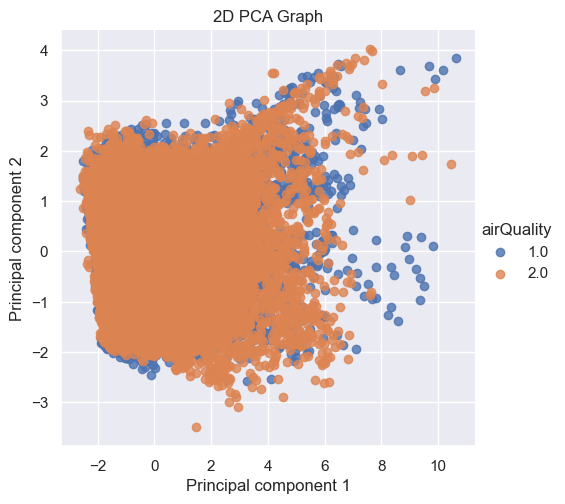

In [21]:
sns.set()
sns.lmplot(
    x='Principal component 1', 
    y='Principal component 2', 
    data=pcaDataFrame, 
    hue='airQuality', 
    fit_reg=False, 
    legend=True
    )
 
plt.title('2D PCA Graph')
plt.show()

In [22]:
tsne = TSNE(n_components = 2)

In [23]:
tsne_features = tsne.fit_transform(features_scaled)

C:\Users\Studying\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\Studying\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [24]:
tsneDataFrame = pd.DataFrame(data = tsne_features, columns = ['Principal component 1', 'Principal component 2'])

In [25]:
tsneDataFrame['airQuality'] = label

In [26]:
tsneDataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31618 entries, 0 to 31617
Data columns (total 3 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Principal component 1  31618 non-null  float32
 1   Principal component 2  31618 non-null  float32
 2   airQuality             28362 non-null  float64
dtypes: float32(2), float64(1)
memory usage: 494.2 KB


In [27]:
tsneDataFrame = tsneDataFrame.dropna(axis=0)

In [28]:
tsneDataFrame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28362 entries, 0 to 31617
Data columns (total 3 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Principal component 1  28362 non-null  float32
 1   Principal component 2  28362 non-null  float32
 2   airQuality             28362 non-null  float64
dtypes: float32(2), float64(1)
memory usage: 664.7 KB


In [29]:
fig = px.scatter(tsneDataFrame, x = 'Principal component 1', y = 'Principal component 2', color=pcaDataFrame['airQuality'])

In [30]:
fig.show()

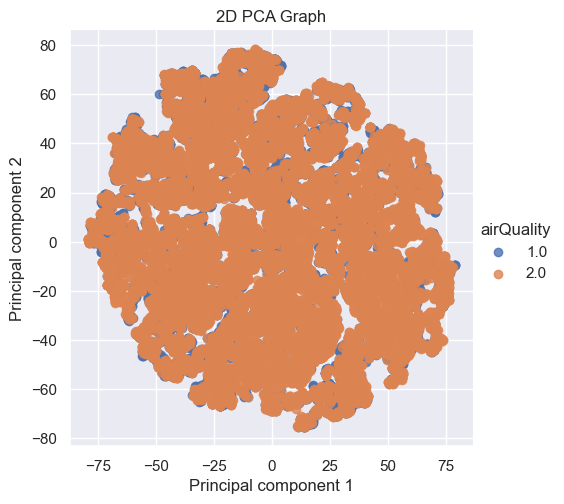

In [31]:
sns.set()
sns.lmplot(
    x='Principal component 1', 
    y='Principal component 2', 
    data=tsneDataFrame, 
    hue='airQuality', 
    fit_reg=False, 
    legend=True
    )
 
plt.title('2D PCA Graph')
plt.show()

# 2. Кластерний аналіз
## За допомогою алгоритму k-means зробіть квантування зображення (видалення візуально надлишкової інформації) з глибиною 64, 32, 16 та 8 рівнів для будь-якого обраного самостійно зображення.

In [32]:
kotek = Image.open("C:/Users/Studying/Data/kotek.jpg")

In [33]:
kotek = np.array(kotek, dtype=np.float64) / 255

In [34]:
w, h, d = original_shape = tuple(kotek.shape)
image_array = np.reshape(kotek, (w * h, d))

In [35]:
print("Fitting model on a small sub-sample of the data")
image_array_sample = shuffle(image_array, random_state=0, n_samples=1_000)
kmeans64 = KMeans(n_clusters=64, random_state=0).fit(image_array_sample)
kmeans32 = KMeans(n_clusters=32, random_state=0).fit(image_array_sample)
kmeans16 = KMeans(n_clusters=16, random_state=0).fit(image_array_sample)
kmeans8 = KMeans(n_clusters=8, random_state=0).fit(image_array_sample)


Fitting model on a small sub-sample of the data


In [36]:
print("Predicting color indices on the full image (k-means)")
labels64 = kmeans64.predict(image_array)
labels32 = kmeans32.predict(image_array)
labels16 = kmeans16.predict(image_array)
labels8 = kmeans8.predict(image_array)

Predicting color indices on the full image (k-means)


In [37]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    return codebook[labels].reshape(w, h, -1)

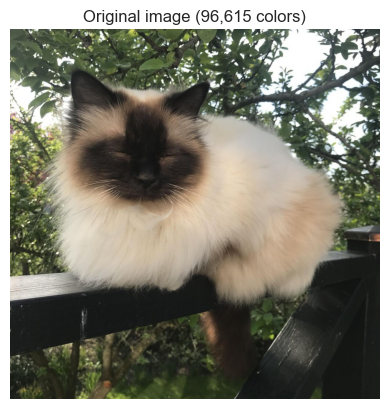

In [38]:
plt.figure(1)
plt.clf()
plt.axis("off")
plt.title("Original image (96,615 colors)")
plt.imshow(kotek)

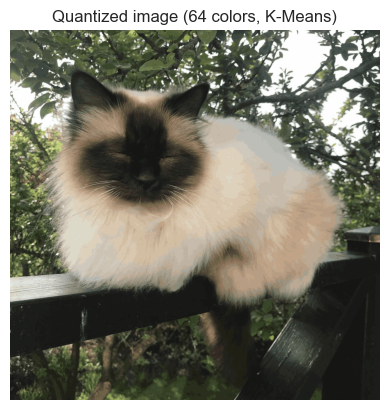

In [39]:
plt.figure(2)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({64} colors, K-Means)")
plt.imshow(recreate_image(kmeans64.cluster_centers_, labels64, w, h))

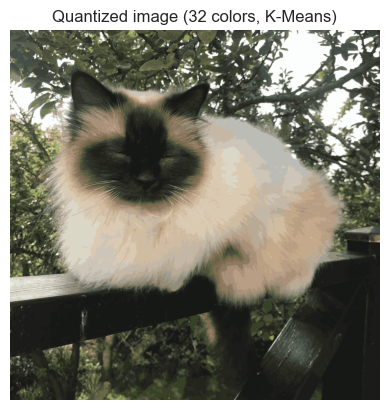

In [40]:
plt.figure(3)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({32} colors, K-Means)")
plt.imshow(recreate_image(kmeans32.cluster_centers_, labels32, w, h))

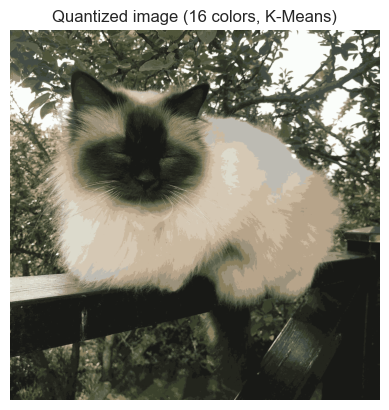

In [41]:
plt.figure(4)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({16} colors, K-Means)")
plt.imshow(recreate_image(kmeans16.cluster_centers_, labels16, w, h))

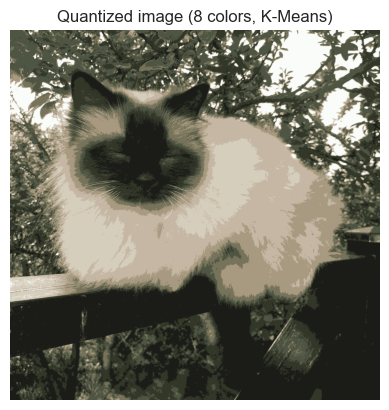

In [42]:
plt.figure(5)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({8} colors, K-Means)")
plt.imshow(recreate_image(kmeans8.cluster_centers_, labels8, w, h))

In [43]:
tsvet = Image.open("C:/Users/Studying/Data/tsvet.jpg")

tsvet = np.array(tsvet, dtype=np.float64) / 255

w, h, d = original_shape = tuple(tsvet.shape)
image_array = np.reshape(tsvet, (w * h, d))

print("Fitting model on a small sub-sample of the data")
image_array_sample = shuffle(image_array, random_state=0, n_samples=1_000)
kmeans64 = KMeans(n_clusters=64, random_state=0).fit(image_array_sample)
kmeans32 = KMeans(n_clusters=32, random_state=0).fit(image_array_sample)
kmeans16 = KMeans(n_clusters=16, random_state=0).fit(image_array_sample)
kmeans8 = KMeans(n_clusters=8, random_state=0).fit(image_array_sample)

print("Predicting color indices on the full image (k-means)")
labels64 = kmeans64.predict(image_array)
labels32 = kmeans32.predict(image_array)
labels16 = kmeans16.predict(image_array)
labels8 = kmeans8.predict(image_array)

Fitting model on a small sub-sample of the data
Predicting color indices on the full image (k-means)


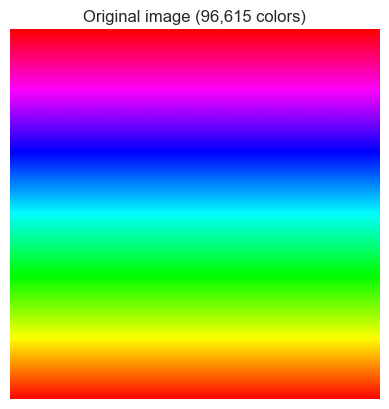

In [44]:
plt.figure(1)
plt.clf()
plt.axis("off")
plt.title("Original image (96,615 colors)")
plt.imshow(tsvet)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


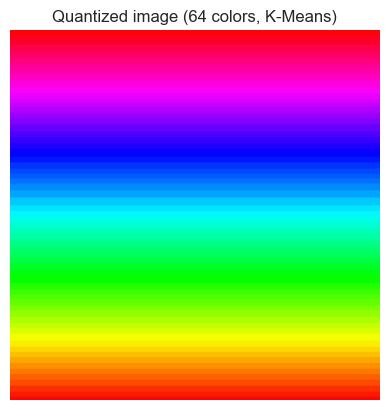

In [45]:
plt.figure(2)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({64} colors, K-Means)")
plt.imshow(recreate_image(kmeans64.cluster_centers_, labels64, w, h))


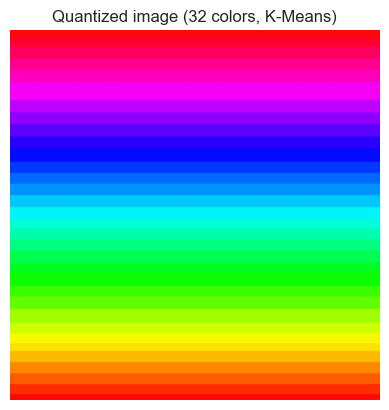

In [46]:
plt.figure(3)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({32} colors, K-Means)")
plt.imshow(recreate_image(kmeans32.cluster_centers_, labels32, w, h))


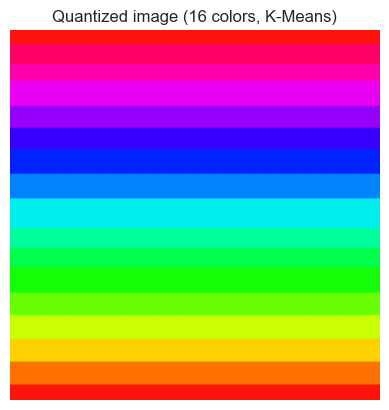

In [47]:
plt.figure(4)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({16} colors, K-Means)")
plt.imshow(recreate_image(kmeans16.cluster_centers_, labels16, w, h))

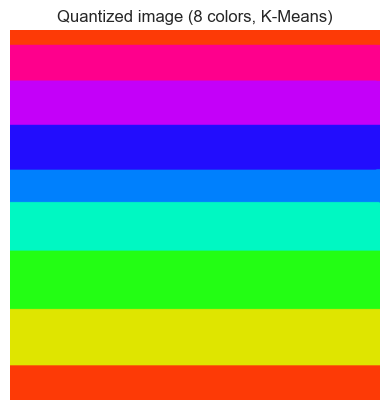

In [48]:
plt.figure(5)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({8} colors, K-Means)")
plt.imshow(recreate_image(kmeans8.cluster_centers_, labels8, w, h))

# 3. Обробка та класифікація текстових даних

## Завантажте набір текстових даних (з мітками класів).

In [49]:
data = [json.loads(line) for line in open('C:\\Users\\Studying\\Data2\\reviews_Amazon_Instant_Video.json', 'r')]

In [50]:
data

[{'reviewerID': 'A1EE2E3N7PW666',
  'asin': 'B000GFDAUG',
  'reviewerName': 'Aaron L. Allen "Orgazmo1009"',
  'helpful': [0, 0],
  'reviewText': "CA Lewsi' review should be removed. he's reviewing a episode from season 10. If your gonna write a review do it for the whole season, not 1 episode thats not even on the season your reviewing it for.",
  'overall': 5.0,
  'summary': 'Stupid',
  'unixReviewTime': 1202256000,
  'reviewTime': '02 6, 2008'},
 {'reviewerID': 'AGZ8SM1BGK3CK',
  'asin': 'B000GFDAUG',
  'reviewerName': "Mind's Clay",
  'helpful': [1, 1],
  'reviewText': 'I truly love the humor of South Park. It\'s social/political commentary and satirical wit and bathroom absurdity rules. No holds barred! I live to breathe another day in anticipation of Trey Parker\'s next installment, whether it be South Park or some other venture. South Park is truly the work of a genius. Thank you, Sir Parker. (In Britian they often "knight" certian individuals (usually after they are "old" or "de

In [51]:
reviews = pd.DataFrame(columns = ["reviewText", "overall"])


In [52]:
for i in range(0, 100_000):
    currentItem = data[i]
    reviews.loc[i] = [data[i]["reviewText"], data[i]["overall"]]

In [53]:
reviews

,reviewText,overall
0,CA Lewsi' review should be removed. he's revie...,5.0
1,I truly love the humor of South Park. It's soc...,5.0
2,This is a cartoon series pitting eight cartoon...,4.0
3,Yeah drawn together is great when it comes to ...,4.0
4,Seems like today's generation is getting reven...,2.0
...,...,...
99995,Love YGG! My son loves this program! It's so c...,5.0
99996,Great show. Fun for kids and adults. A refresh...,5.0
99997,"Quite different from the rest, but my two year...",5.0
99998,My daughter started watching Yo Gabba Gabba wh...,4.0


In [54]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   reviewText  100000 non-null  object 
 1   overall     100000 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.3+ MB


In [55]:
print(reviews.isnull().sum())

reviewText    0
overall       0
dtype: int64


(array([ 6963.,     0.,  4065.,     0.,     0.,  7074.,     0., 16465.,
            0., 65433.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

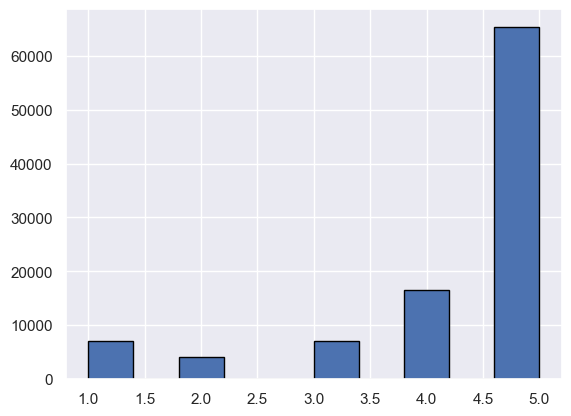

In [56]:
plt.hist(reviews['overall'], edgecolor="black")

In [57]:
conditions = [
    (reviews['overall'] == 4.0),
    (reviews['overall'] == 1.0) | (reviews['overall'] == 2.0)]

In [58]:
values = [4, 2]

In [59]:
reviews['overall'] = np.select(conditions, values)

In [60]:
reviews.head

<bound method NDFrame.head of                                               reviewText  overall
0      CA Lewsi' review should be removed. he's revie...        0
1      I truly love the humor of South Park. It's soc...        0
2      This is a cartoon series pitting eight cartoon...        4
3      Yeah drawn together is great when it comes to ...        4
4      Seems like today's generation is getting reven...        2
...                                                  ...      ...
99995  Love YGG! My son loves this program! It's so c...        0
99996  Great show. Fun for kids and adults. A refresh...        0
99997  Quite different from the rest, but my two year...        0
99998  My daughter started watching Yo Gabba Gabba wh...        4
99999  My grandchildren love Yo Gabba Gabba and I do ...        0

[100000 rows x 2 columns]>

(array([72507.,     0.,     0.,     0.,     0., 11028.,     0.,     0.,
            0., 16465.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <BarContainer object of 10 artists>)

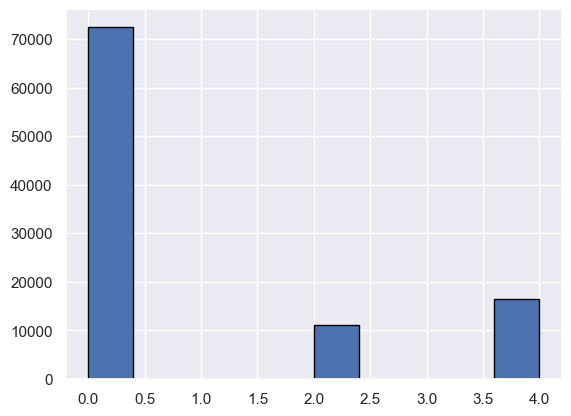

In [61]:
plt.hist(reviews['overall'], edgecolor="black")

In [62]:
index = reviews[ (reviews['overall'] == 0)].index
reviews.drop(index , inplace=True)

In [63]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27493 entries, 2 to 99998
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   reviewText  27493 non-null  object
 1   overall     27493 non-null  int32 
dtypes: int32(1), object(1)
memory usage: 537.0+ KB


(array([11028.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 16465.]),
 array([2. , 2.2, 2.4, 2.6, 2.8, 3. , 3.2, 3.4, 3.6, 3.8, 4. ]),
 <BarContainer object of 10 artists>)

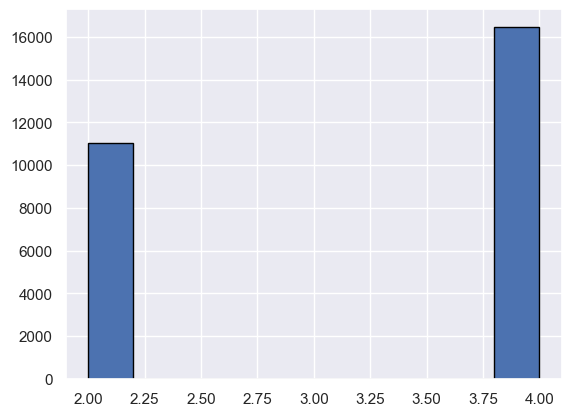

In [64]:
plt.hist(reviews['overall'], edgecolor="black")

## Проведіть передобробку даних (видаліть стоп-слова, пунктуацію)

In [65]:
reviews.head

<bound method NDFrame.head of                                               reviewText  overall
2      This is a cartoon series pitting eight cartoon...        4
3      Yeah drawn together is great when it comes to ...        4
4      Seems like today's generation is getting reven...        2
7      I liked this product. I am a big fan of Drawn ...        4
13     Ok, I've watched at least 60 percent of Drawn ...        2
...                                                  ...      ...
99982  This is the season that made Yo Gabba Gabba fa...        4
99984  One of the only things that is able to grab an...        4
99985  Wish Amazon would add the other seasons to Pri...        4
99993  My younger kids love this show!  The songs are...        4
99998  My daughter started watching Yo Gabba Gabba wh...        4

[27493 rows x 2 columns]>

In [66]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Studying\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [67]:
nltk.download('words')

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Studying\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [68]:
stopWords = stopwords.words('english')

In [69]:
stopWords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [70]:
words = set(nltk.corpus.words.words())

In [71]:
reviews['reviewText'][13]

'Ok, I\'ve watched at least 60 percent of Drawn together episodes out there. Yet i don\'t ever recall laughing past a grin. The characters are boxed into stereotypes leaving absolutely nothing funny to them but the obvious and predictable jokes . It has never displayed the wit of most "adult themed" animated shows out there. I cant see this show lasting many seasons more with the slight premise of the show. Tired stuff dawg!'

In [72]:
reviews['reviewText'][4]

"Seems like today's generation is getting revenge on the censorship from the pastand is trying to open up all cans of worms. I guess nice cartoons with good storiesand some morals are out and crude in your face stuff is in.  Some of these arereally funny, have funny situations but its not for everybody and i would'nt let youngkids see it as you have male and female full frontal...characters urinating andother weird stuff....and also the writters must be gay...cause theres a lot ofgay situations...  But what would you expect from a generation of Reality show watchers.....Hope the next generation of cartoons brings back quality instead of quantity of crap."

In [73]:
reviews['reviewText'] = reviews['reviewText'].str.lower()

In [74]:
reviews['reviewText'][13]

'ok, i\'ve watched at least 60 percent of drawn together episodes out there. yet i don\'t ever recall laughing past a grin. the characters are boxed into stereotypes leaving absolutely nothing funny to them but the obvious and predictable jokes . it has never displayed the wit of most "adult themed" animated shows out there. i cant see this show lasting many seasons more with the slight premise of the show. tired stuff dawg!'

In [75]:
reviews['reviewText'] = reviews['reviewText'].str.replace('[^\w\s]',' ')

C:\Users\Studying\AppData\Local\Temp\ipykernel_13572\3380835693.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [76]:
reviews['reviewText'][13]

'ok  i ve watched at least 60 percent of drawn together episodes out there  yet i don t ever recall laughing past a grin  the characters are boxed into stereotypes leaving absolutely nothing funny to them but the obvious and predictable jokes   it has never displayed the wit of most  adult themed  animated shows out there  i cant see this show lasting many seasons more with the slight premise of the show  tired stuff dawg '

In [77]:
reviews['reviewText'][99984]

'one of the only things that is able to grab and hold my 15 month old daughters attention   it is semi educational too'

In [78]:
reviews['reviewText'] = reviews['reviewText'].str.replace(r'[0-9]', ' ')

C:\Users\Studying\AppData\Local\Temp\ipykernel_13572\391229718.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [79]:
reviews['reviewText'][13]

'ok  i ve watched at least    percent of drawn together episodes out there  yet i don t ever recall laughing past a grin  the characters are boxed into stereotypes leaving absolutely nothing funny to them but the obvious and predictable jokes   it has never displayed the wit of most  adult themed  animated shows out there  i cant see this show lasting many seasons more with the slight premise of the show  tired stuff dawg '

In [80]:
reviews['reviewText'][99984]

'one of the only things that is able to grab and hold my    month old daughters attention   it is semi educational too'

In [81]:
reviews['reviewText'] = reviews['reviewText'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopWords)]))

In [82]:
reviews['reviewText'] = reviews['reviewText'].apply(lambda x: ' '.join([word for word in x.split() if word in (words)]))

In [83]:
reviews['reviewText'] = reviews['reviewText'].str.replace('[^\w\s]',' ')

C:\Users\Studying\AppData\Local\Temp\ipykernel_13572\3380835693.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [85]:
reviews['reviewText'][13]

'watched least percent drawn together yet ever recall laughing past grin leaving absolutely nothing funny obvious predictable never displayed wit adult animated cant see show lasting many slight premise show tired stuff'

In [86]:
reviews['reviewText'][4]

'like today generation getting revenge censorship trying open guess nice good morals crude face stuff funny funny everybody would let see male female full frontal weird stuff also must gay cause theres lot would expect generation reality show hope next generation back quality instead quantity crap'

In [88]:
reviews['reviewText'] = reviews['reviewText'].str.replace(' +', ' ')

C:\Users\Studying\AppData\Local\Temp\ipykernel_13572\4099604784.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [89]:
reviews['reviewText'][13]

'watched least percent drawn together yet ever recall laughing past grin leaving absolutely nothing funny obvious predictable never displayed wit adult animated cant see show lasting many slight premise show tired stuff'

In [90]:
reviews['reviewText'][4]

'like today generation getting revenge censorship trying open guess nice good morals crude face stuff funny funny everybody would let see male female full frontal weird stuff also must gay cause theres lot would expect generation reality show hope next generation back quality instead quantity crap'

In [91]:
reviews['reviewText'][99984]

'one able grab hold month old attention semi educational'

## За допомогою wordcloud зробіть візуалізацію найбільш поширених слів або n-gram у кожному класі.

In [92]:
reviews[reviews["overall"] == 4]["reviewText"]

2        cartoon series pitting eight cartoon pseudo re...
3        yeah drawn together great comes crude humor fi...
7        product big fan drawn together best season far...
15       short lived show pretty decent would recommend...
25                              always live show day funny
                               ...                        
99982    season made yo famous content top shelf entert...
99984    one able grab hold month old attention semi ed...
99985    wish would add prime instant video getting lit...
99993    younger love show catchy careful though get st...
99998    daughter watching yo still learned numerous ne...
Name: reviewText, Length: 16465, dtype: object

In [93]:
textPositive = " ".join(rev for rev  in reviews[reviews["overall"] == 4]["reviewText"]) 

In [94]:
textPositive

'cartoon series pitting eight cartoon pseudo reality environment watched three three one overall three worth watch one best average price box set affordable laugh possible start watching season show almost always recommend starting season one much sequential story line parody satirical humor type humor everyone understand subtle yeah drawn together great comes crude humor first season hilarious sometimes found second season still great season definite buy fan crude humor hilarious product big fan drawn together best season far extra cool wait next season comes short lived show pretty decent would recommend show adult cartoon parody spoof stupid reality reason good voice work interesting would recommend adult cartoon fan always live show day funny product promptly stated drawn together funny faint hearted like humour crude full frontal season funny received product promptly hubby birthday looking item awhile glad able come like politically incorrect humor barred toon went little gay sea

In [95]:
textNegative = " ".join(rev for rev  in reviews[reviews["overall"] == 2]["reviewText"]) 

In [96]:
textNegative

'like today generation getting revenge censorship trying open guess nice good morals crude face stuff funny funny everybody would let see male female full frontal weird stuff also must gay cause theres lot would expect generation reality show hope next generation back quality instead quantity crap watched least percent drawn together yet ever recall laughing past grin leaving absolutely nothing funny obvious predictable never displayed wit adult animated cant see show lasting many slight premise show tired stuff gave one star quality like comedy central ago also lot censorship contrary seen drawn together collection season one got birthday graduating high school back dislike even though big fan drawn together would recommend anyone even enjoy watching show hi usually embarrassed adult humor uncensored version goes far mean need see nude enjoy movie contrary ruined clean version disk stuck watching trying get filth sure like pass selling mine want limit review vol king poet warrior sinc

In [97]:
wordCloudPositive = WordCloud(width = 3000, height = 2000).generate(textPositive)
wordCloudNegative = WordCloud(width = 3000, height = 2000).generate(textNegative)

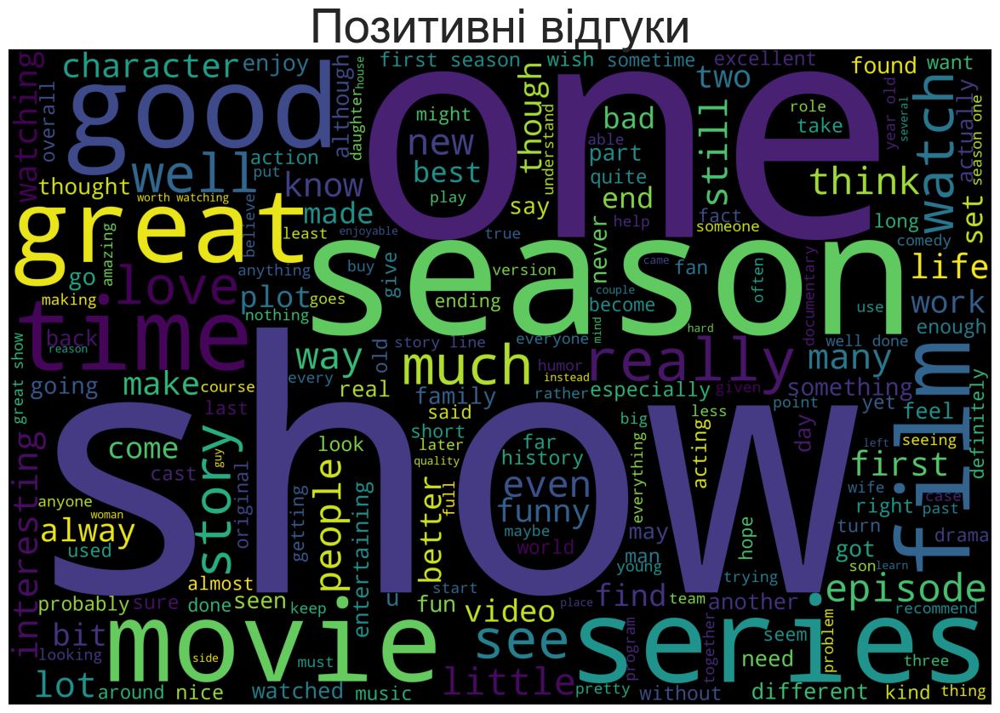

In [118]:
plt.figure(figsize=(20,10))
plt.imshow(wordCloudPositive)
plt.axis("off")
plt.title("Позитивні відгуки", fontsize=40)
plt.show()

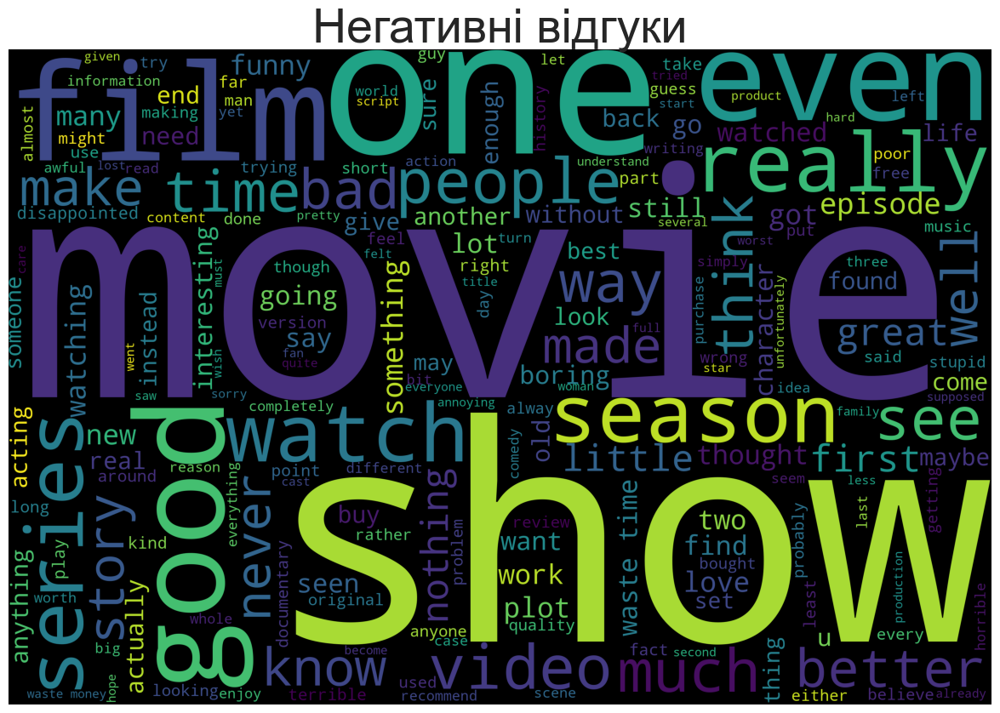

In [119]:
plt.figure(figsize=(20,10))
plt.imshow(wordCloudNegative)
plt.axis("off")
plt.title("Негативні відгуки", fontsize=40)
plt.show()

## Векторизуйте тексти (наприклад за допомогою sklearn.feature_extraction.text.TfidfVectorizer). 

In [100]:
tFidfVectorizer = TfidfVectorizer()

In [101]:
reviewsVector = tFidfVectorizer.fit_transform(reviews["reviewText"])

In [102]:
tFidfVectorizer.get_feature_names_out()

array(['aa', 'aardvark', 'aback', ..., 'zoology', 'zoom', 'zorro'],
      dtype=object)

In [103]:
tFidfVectorizer.get_feature_names_out()

array(['aa', 'aardvark', 'aback', ..., 'zoology', 'zoom', 'zorro'],
      dtype=object)

In [104]:
print(reviewsVector)

  (0, 15742)	0.16553043415012472
  (0, 17228)	0.11935076281862052
  (0, 5571)	0.11971731815580725
  (0, 17029)	0.12540963005554415
  (0, 7822)	0.23399866686421267
  (0, 13929)	0.2152439267311554
  (0, 11414)	0.18276499817619368
  (0, 9346)	0.10761400341233868
  (0, 15551)	0.07842042931356898
  (0, 14284)	0.25170325428046947
  (0, 10420)	0.0776453978205364
  (0, 15408)	0.15088681577884194
  (0, 13030)	0.1001166711316748
  (0, 480)	0.10022884073568099
  (0, 442)	0.11174704918459785
  (0, 14506)	0.05959700276744032
  (0, 14140)	0.13997517961778722
  (0, 18087)	0.07674033523869978
  (0, 15406)	0.11539693238388204
  (0, 12135)	0.14066193208492006
  (0, 9127)	0.1307396428790285
  (0, 290)	0.21340128980389603
  (0, 14319)	0.10453457502165729
  (0, 1855)	0.13770161395819736
  (0, 12336)	0.12366667905012771
  :	:
  (27491, 9518)	0.20212918452358844
  (27491, 6794)	0.1892727131014653
  (27491, 15654)	0.39007118861963397
  (27491, 16424)	0.24558970214522333
  (27491, 14506)	0.14954804838124822
  

## Проведіть класифікацію текстових даних, зробіть оцінку якості. 

In [105]:
X_train, X_test, Y_train, Y_test = train_test_split(reviewsVector, reviews['overall'], test_size = 0.25, random_state = 0)

In [106]:
X_train.shape

(20619, 18622)

In [107]:
Y_train.shape

(20619,)

In [108]:
knn = KNeighborsClassifier(n_neighbors = 49)

knn.fit(X_train, Y_train.values.ravel())
knn_prediction = knn.predict(X_test)

print(classification_report(Y_test ,knn_prediction ))
print('Confusion Matrix: \n', confusion_matrix(Y_test,knn_prediction))
print()
print('Accuracy: ', accuracy_score(Y_test,knn_prediction))

              precision    recall  f1-score   support

           2       0.82      0.56      0.66      2743
           4       0.76      0.92      0.83      4131

    accuracy                           0.77      6874
   macro avg       0.79      0.74      0.75      6874
weighted avg       0.78      0.77      0.76      6874

Confusion Matrix: 
 [[1523 1220]
 [ 340 3791]]

Accuracy:  0.7730578993308117


In [109]:
tree_classifier = DecisionTreeClassifier()

tree_classifier.fit(X_train, Y_train)
tree_prediction = tree_classifier.predict(X_test)

print(classification_report(Y_test ,tree_prediction ))
print('Confusion Matrix: \n', confusion_matrix(Y_test,tree_prediction))
print()
print('Accuracy: ', accuracy_score(Y_test,tree_prediction))

              precision    recall  f1-score   support

           2       0.65      0.63      0.64      2743
           4       0.76      0.78      0.77      4131

    accuracy                           0.72      6874
   macro avg       0.71      0.70      0.70      6874
weighted avg       0.72      0.72      0.72      6874

Confusion Matrix: 
 [[1733 1010]
 [ 925 3206]]

Accuracy:  0.7185045097468723


In [110]:
svm_classifier = SVC()

svm_classifier.fit(X_train, Y_train.values.ravel())
svm_prediction = svm_classifier.predict(X_test)

print(classification_report(Y_test ,svm_prediction ))
print('Confusion Matrix: \n', confusion_matrix(Y_test,svm_prediction))
print()
print('Accuracy: ', accuracy_score(Y_test,svm_prediction))

              precision    recall  f1-score   support

           2       0.85      0.74      0.79      2743
           4       0.84      0.91      0.88      4131

    accuracy                           0.85      6874
   macro avg       0.85      0.83      0.84      6874
weighted avg       0.85      0.85      0.84      6874

Confusion Matrix: 
 [[2042  701]
 [ 353 3778]]

Accuracy:  0.8466686063427408


In [111]:
randomForest = RandomForestClassifier()

randomForest.fit(X_train, Y_train.values.ravel())
randomForest_prediction = randomForest.predict(X_test)

print(classification_report(Y_test, randomForest_prediction ))
print('Confusion Matrix: \n', confusion_matrix(Y_test, randomForest_prediction))
print()
print('Accuracy: ', accuracy_score(Y_test,randomForest_prediction))

              precision    recall  f1-score   support

           2       0.84      0.66      0.74      2743
           4       0.80      0.92      0.86      4131

    accuracy                           0.81      6874
   macro avg       0.82      0.79      0.80      6874
weighted avg       0.82      0.81      0.81      6874

Confusion Matrix: 
 [[1808  935]
 [ 338 3793]]

Accuracy:  0.8148094268257201


In [112]:
ada = AdaBoostClassifier()

ada.fit(X_train, Y_train.values.ravel())
ada_predictions = ada.predict(X_test)

print(classification_report(Y_test, ada_predictions ))
print('Confusion Matrix: \n', confusion_matrix(Y_test, ada_predictions))
print()
print('Accuracy: ', accuracy_score(Y_test,ada_predictions))

              precision    recall  f1-score   support

           2       0.78      0.57      0.66      2743
           4       0.76      0.89      0.82      4131

    accuracy                           0.76      6874
   macro avg       0.77      0.73      0.74      6874
weighted avg       0.77      0.76      0.76      6874

Confusion Matrix: 
 [[1559 1184]
 [ 439 3692]]

Accuracy:  0.7638929298807099
